In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pdal
%matplotlib inline

import random
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [2]:
from sklearn.metrics import f1_score, roc_auc_score

## IMPORT DATA

----------------------

**Below is a brief summary of the data, for details please see Feature Engineering Notebook.**

TARGET COLUMN

* **Dimensionality:** Row values 0, 1, 2 represent the point (row) is part of a linear, planar, or volumetric feature respectively. 
* For logistic regression, planar and linear are collapsed into a single value to get a binary.

FEATURE COLUMNS

* **X,Y,Z:** These together make up is the spatial location of each point. *Each model is run with and without these values to see if the model can generalize.*
* **Eigenvalue0,1,2:** These columns represent the eigenvalues calculated from KNN = 500 for each point. See Feature Engeeering Notebook for details on my interpretation of what these values represent, what decisions I made regarding their form.
* **Verticality:** A value from 0 to 1 indicating the probability the point and its KNN = 500 represents a 'vertical' feature. See Feature Engineering Notebook for details.
* **KDistance:** Euclidean distance between the point and its KNN = 500 (500th nearest point)

*The descriptions of the following features are taken from the pdal package documentation*

* **LocalReachabilityDistance:** The inverse of the mean of all 'reachability distances' for a neighborhood of K=500 points. 'Reachability distance' is defined as the max fo the Euclidean distance to a neighboring point and that neighbor's own previously computed **KDistance**.
* **LocalOutlierFactor:** The mean of all **LocalReachabilityDistance** values for the neighborhood of K=500.  


In [3]:
df = pd.read_csv('mini_df_resampled2.csv')
df = df.drop(['Unnamed: 0','Linearity','Planarity','Scattering'],axis=1)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1313037 entries, 0 to 1313036
Data columns (total 11 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   X                          1313037 non-null  float64
 1   Y                          1313037 non-null  float64
 2   Z                          1313037 non-null  float64
 3   Eigenvalue0                1313037 non-null  float64
 4   Eigenvalue1                1313037 non-null  float64
 5   Eigenvalue2                1313037 non-null  float64
 6   Verticality                1313037 non-null  float64
 7   dimensionality             1313037 non-null  int64  
 8   KDistance                  1313037 non-null  float64
 9   LocalReachabilityDistance  1313037 non-null  float64
 10  LocalOutlierFactor         1313037 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 110.2 MB


**Note: engineered dataset to create equality among target classifications. See Feature Engineering Notebook for details.**

In [5]:
df.dimensionality.value_counts()

2    437679
1    437679
0    437679
Name: dimensionality, dtype: int64

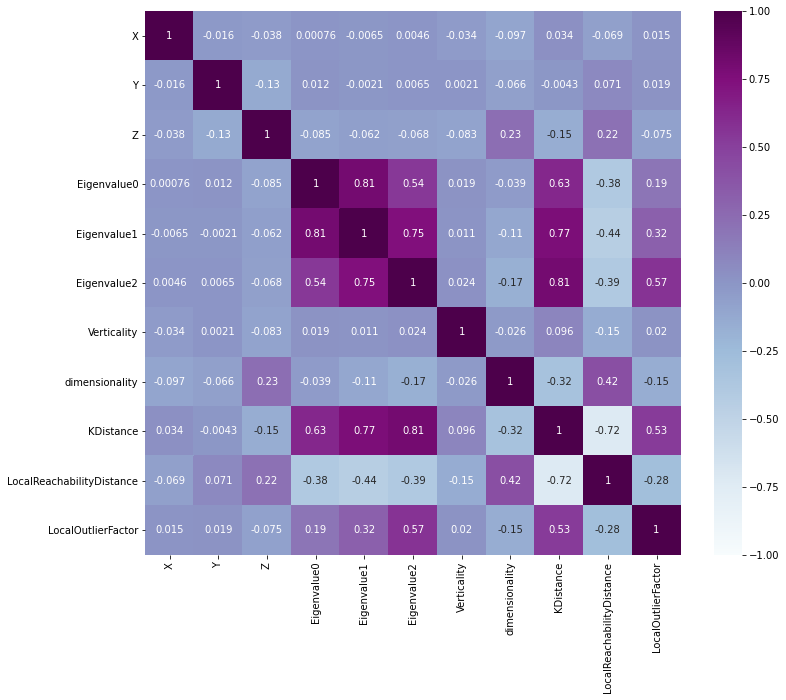

In [6]:
plt.figure(figsize = (12,10))
sns.heatmap(df.corr(), cmap="BuPu", annot=True, vmin=-1, vmax=1);

In [35]:
df_train = df[df.X < 0].copy()
df_test = df[df.X >= 0].copy()
y_train = df_train['dimensionality']
y_test = df_test['dimensionality']
X_train = df_train.drop(['dimensionality'],axis=1)
X_test = df_test.drop(['dimensionality'],axis=1)

X_train_dims = X_train[['X','Y','Z']]
X_train_nodims = X_train.drop(['X','Y','Z'],axis=1)

X_test_dims = X_test[['X','Y','Z']]
X_test_nodims = X_test.drop(['X','Y','Z'],axis=1)



In [36]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 588081 entries, 0 to 1313036
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   X                          588081 non-null  float64
 1   Y                          588081 non-null  float64
 2   Z                          588081 non-null  float64
 3   Eigenvalue0                588081 non-null  float64
 4   Eigenvalue1                588081 non-null  float64
 5   Eigenvalue2                588081 non-null  float64
 6   Verticality                588081 non-null  float64
 7   dimensionality             588081 non-null  int64  
 8   KDistance                  588081 non-null  float64
 9   LocalReachabilityDistance  588081 non-null  float64
 10  LocalOutlierFactor         588081 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 53.8 MB


**The train/test split is non-random in my case. We train on half of the space, and test on the other. 

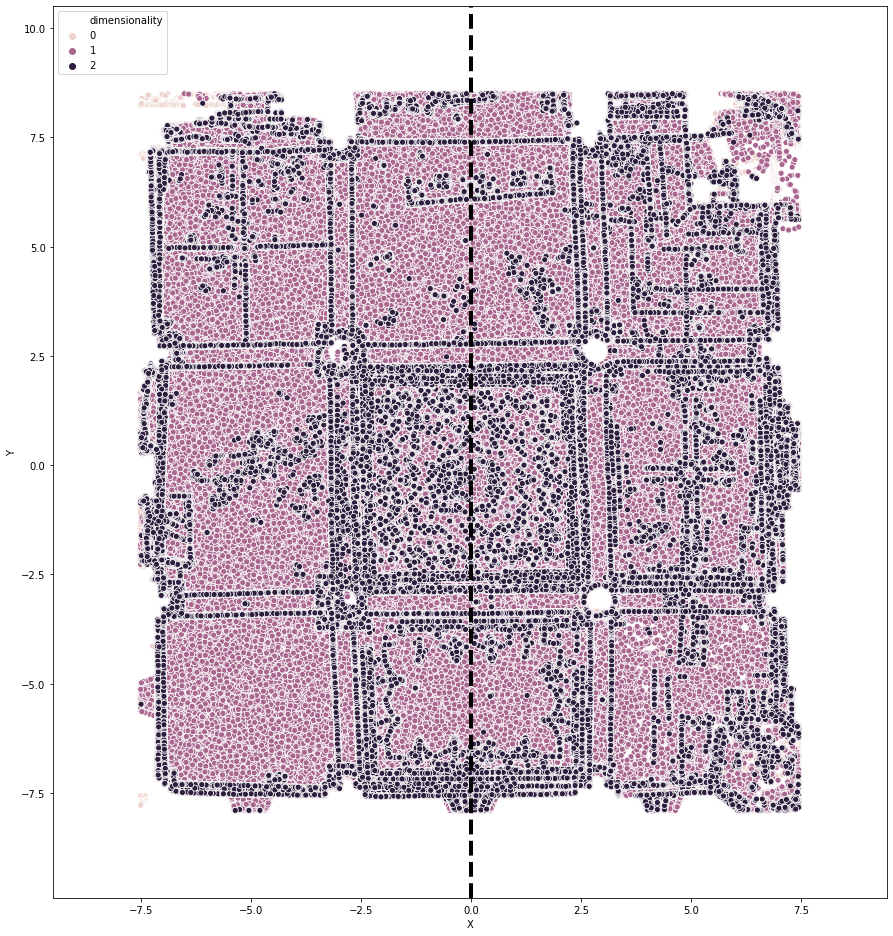

In [180]:
#PLAN (Z ELEVATION) PLOTTER
a = df.X #x axis
b = df.Y #y axis
color = df.dimensionality #color class
x_neg = -7.5
x_pos = 7.45
y_neg = -7.9
y_pos = 8.5

plt.figure(figsize = ((((x_neg*-1)+x_pos)),(((y_neg*-1)+y_pos))))
plt.axis([x_neg-2, x_pos+2, y_neg-2, y_pos+2])
sns.set_palette("Reds")
sns.scatterplot(x = a, y = b, cmap = "Reds", hue = color)
plt.plot([0,0],[y_neg-2,y_pos+2],  linewidth=4,color = 'black', linestyle = 'dashed') #Train/Test Division
#plt.grid()
plt.legend(loc='upper left')


## 1. KNN Model

This was done purely as a curiosity. Accuracy scores comparing feature sets containing and omitting point X,Y,Z values.

In [9]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred))

0.4622294318551747


In [37]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_nodims, y_train)
y_pred = knn.predict(X_test_nodims)
print(metrics.accuracy_score(y_test, y_pred))

0.6508712252881554


3D and planar plot of test vs train data.

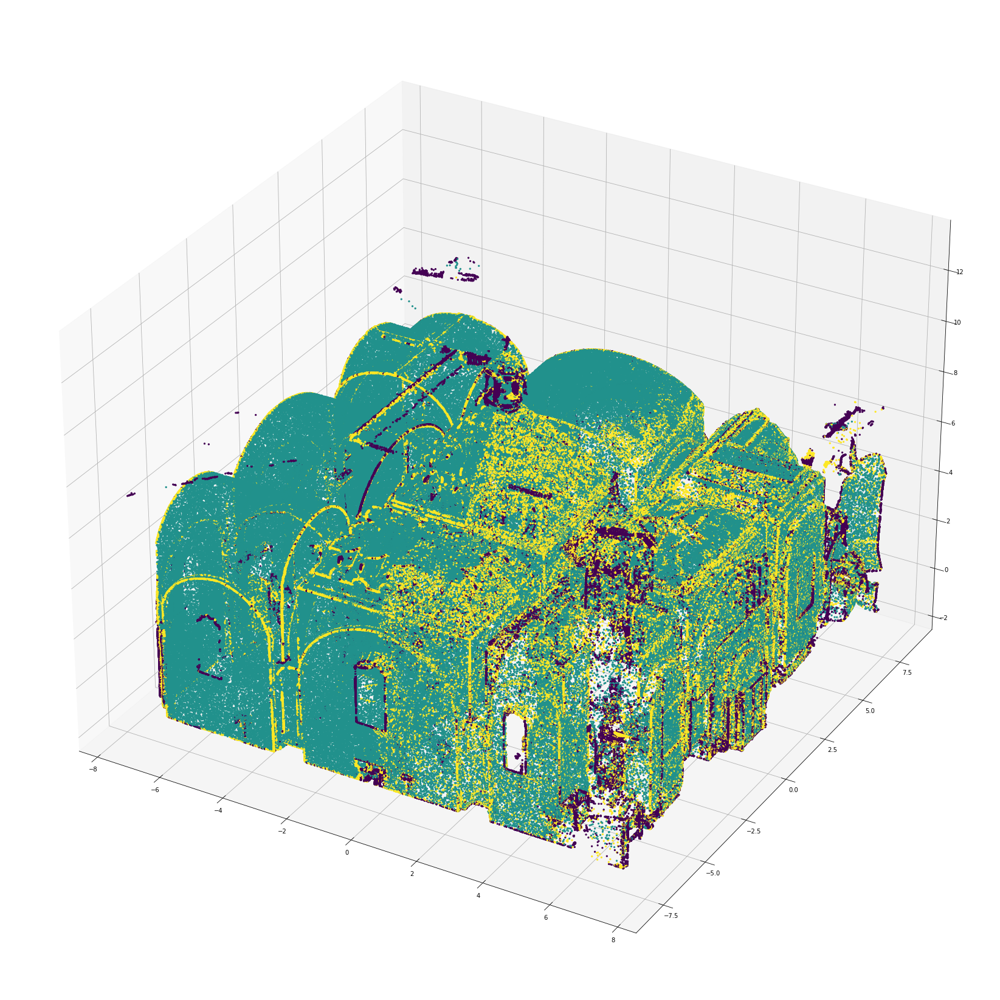

In [20]:
#3D PLOT

fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

xs = X_train.X
ys = X_train.Y
zs = X_train.Z
ax.scatter(xs, ys, zs, s=5, alpha = 1, c = y_train)

xd = X_test.X
yd = X_test.Y
zd = X_test.Z
ax.scatter(xd, yd, zd, s=5, alpha = 1, c = y_pred)
plt.show()

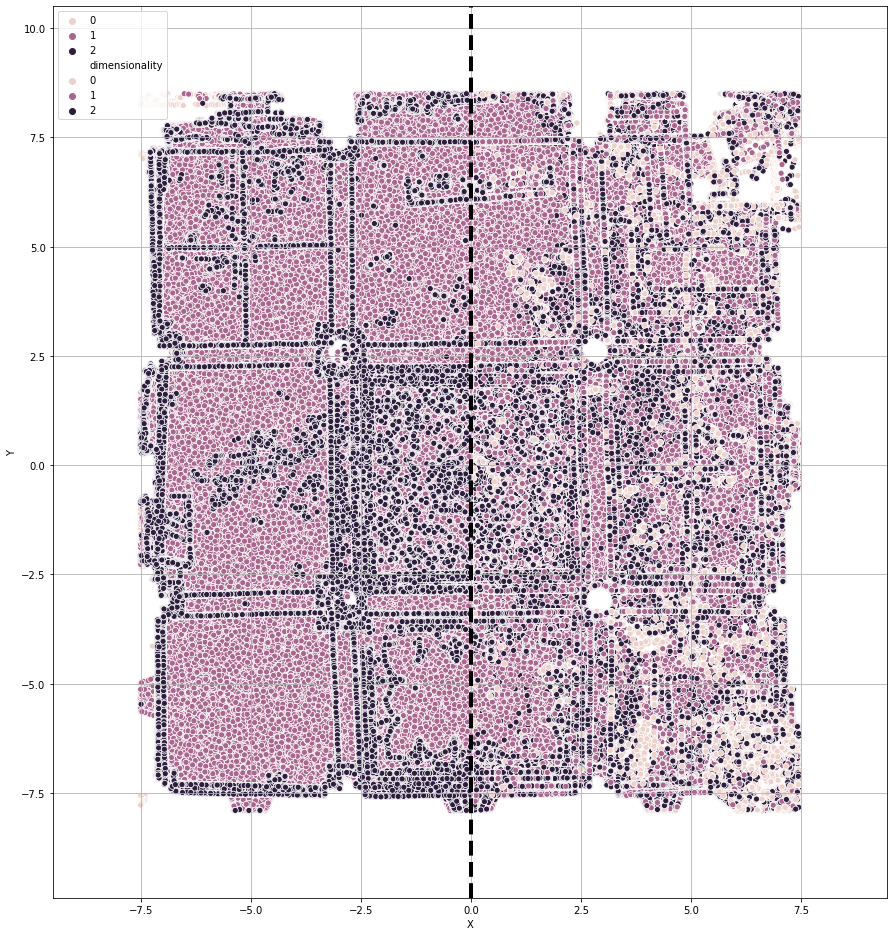

In [39]:
#PLAN (Z ELEVATION) PLOTTER
a = X_test_dims.X #x axis
b = X_test_dims.Y #y axis
color = y_pred #color class

c = X_train.X
d = X_train.Y
colorx = y_train

x_neg = -7.5
x_pos = 7.45
y_neg = -7.9
y_pos = 8.5

plt.figure(figsize = ((((x_neg*-1)+x_pos)),(((y_neg*-1)+y_pos))))
plt.axis([x_neg-2, x_pos+2, y_neg-2, y_pos+2])

sns.scatterplot(x = a, y = b, hue = color)
sns.scatterplot(x = c, y = d, hue = colorx)

plt.plot([0,0],[y_neg-2,y_pos+2], linewidth=4,color = 'black', linestyle = 'dashed') #Train/Test Division
plt.grid()
plt.legend(loc='upper left')

In [42]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[205392,  18843,  59249],
       [  6895, 140528,  53375],
       [ 30552,  84189, 125933]])

Cross-Validation, accuracy score... Interest sort of fades here

In [111]:
scores = cross_val_score(knn, X, y, cv=10, scoring='accuracy')
print(scores)

[0.8832785  0.89483946 0.76846098 0.85627247 0.86876257 0.8335085
 0.88316426 0.86985065 0.85308028 0.75751506]


In [112]:
print(scores.mean())

0.8468732715271365


Search for optimal 'K', modify k_range!

In [268]:
k_range = list(range(5, 20))
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X, y, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())

Text(0, 0.5, 'Cross-Validated Accuracy')

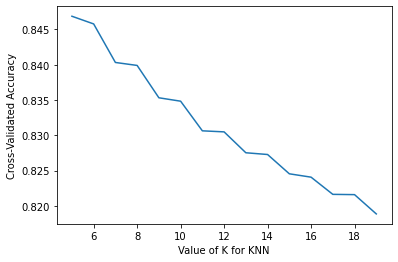

In [269]:
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

-----------
## 2. Logistic Regression Model


First, I modify the target variable into a binary. Linear and Planar are collapsed into a single value. This logic is kept for the remaining models.

In [87]:
df_1 = df[df.dimensionality == 1].copy()
df_0 = df[df.dimensionality == 0].copy()

df_0 = df_0.sample((437679//2))
df_1 = df_1.sample((437679//2))

log_df = df[df.dimensionality ==2].copy()
log_df = pd.concat([log_df,df_0,df_1])

In [88]:
log_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 875357 entries, 875358 to 671789
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   X                          875357 non-null  float64
 1   Y                          875357 non-null  float64
 2   Z                          875357 non-null  float64
 3   Eigenvalue0                875357 non-null  float64
 4   Eigenvalue1                875357 non-null  float64
 5   Eigenvalue2                875357 non-null  float64
 6   Verticality                875357 non-null  float64
 7   dimensionality             875357 non-null  int64  
 8   KDistance                  875357 non-null  float64
 9   LocalReachabilityDistance  875357 non-null  float64
 10  LocalOutlierFactor         875357 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 80.1 MB


In [89]:
def collapser(row):
    if row.dimensionality == 0:
        return 1
    else:
        return row.dimensionality

In [90]:
log_df.dimensionality = log_df.apply(collapser, axis=1)

In [91]:
df_train = log_df[log_df.X < 0].copy()
df_test = log_df[log_df.X >= 0].copy()
y_train = df_train['dimensionality']
y_test = df_test['dimensionality']
X_train = df_train.drop(['dimensionality'],axis=1)
X_test = df_test.drop(['dimensionality'],axis=1)

X_train_dims = X_train[['X','Y','Z']]
X_train_nodims = X_train.drop(['X','Y','Z'],axis=1)

X_test_dims = X_test[['X','Y','Z']]
X_test_nodims = X_test.drop(['X','Y','Z'],axis=1)

In [118]:
X_test_nodims.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 482993 entries, 875360 to 871914
Data columns (total 7 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Eigenvalue0                482993 non-null  float64
 1   Eigenvalue1                482993 non-null  float64
 2   Eigenvalue2                482993 non-null  float64
 3   Verticality                482993 non-null  float64
 4   KDistance                  482993 non-null  float64
 5   LocalReachabilityDistance  482993 non-null  float64
 6   LocalOutlierFactor         482993 non-null  float64
dtypes: float64(7)
memory usage: 29.5 MB


------------------
**Fit Logistic Regression Model to training data WITH global dimensions.**

In [119]:
logreg = LogisticRegression(solver= 'liblinear', C=1000)
logreg.fit(X_train, y_train)

LogisticRegression(C=1000, solver='liblinear')

In [120]:
y_pred = logreg.predict(X_test)

In [121]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[213916,  28403],
       [ 21177, 219497]])

In [122]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITH DIMENSIONS')
print('-----------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITH DIMENSIONS
-----------------------
PRECISION:  0.8854255748285599
RECALL:  0.912009606355485
F1 SCORE:  0.8985210019362471


---------------------
**Fit Logistic Regression Model on ALL data WITH global dimensions.**

Primarily used to plot the data for comparison.

In [123]:

X = pd.concat([X_train,X_test])
y = pd.concat([y_train,y_test])
y_pred = logreg.predict(X)



In [124]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 875357 entries, 875358 to 871914
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   X                          875357 non-null  float64
 1   Y                          875357 non-null  float64
 2   Z                          875357 non-null  float64
 3   Eigenvalue0                875357 non-null  float64
 4   Eigenvalue1                875357 non-null  float64
 5   Eigenvalue2                875357 non-null  float64
 6   Verticality                875357 non-null  float64
 7   KDistance                  875357 non-null  float64
 8   LocalReachabilityDistance  875357 non-null  float64
 9   LocalOutlierFactor         875357 non-null  float64
dtypes: float64(10)
memory usage: 73.5 MB


In [125]:
cm = confusion_matrix(y, y_pred)
cm

array([[378855,  58823],
       [ 30223, 407456]])

In [126]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITH DIMENSIONS: ALL DATA')
print('---------------------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITH DIMENSIONS: ALL DATA
---------------------------------
PRECISION:  0.873845916286172
RECALL:  0.9309471096397132
F1 SCORE:  0.9014932109677662


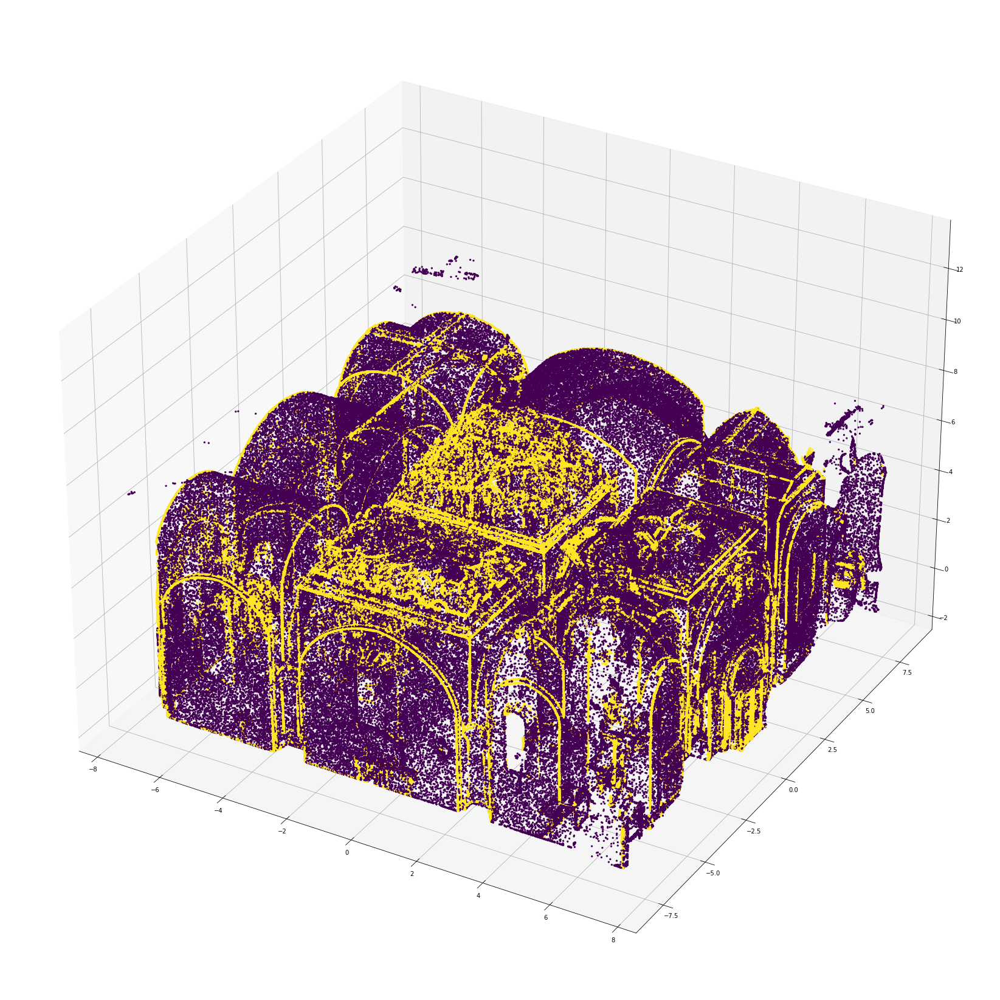

In [127]:
fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

xs = X.X
ys = X.Y
zs = X.Z
ax.scatter(xs, ys, zs, s=5, alpha = 1, c = y_pred)

plt.show()

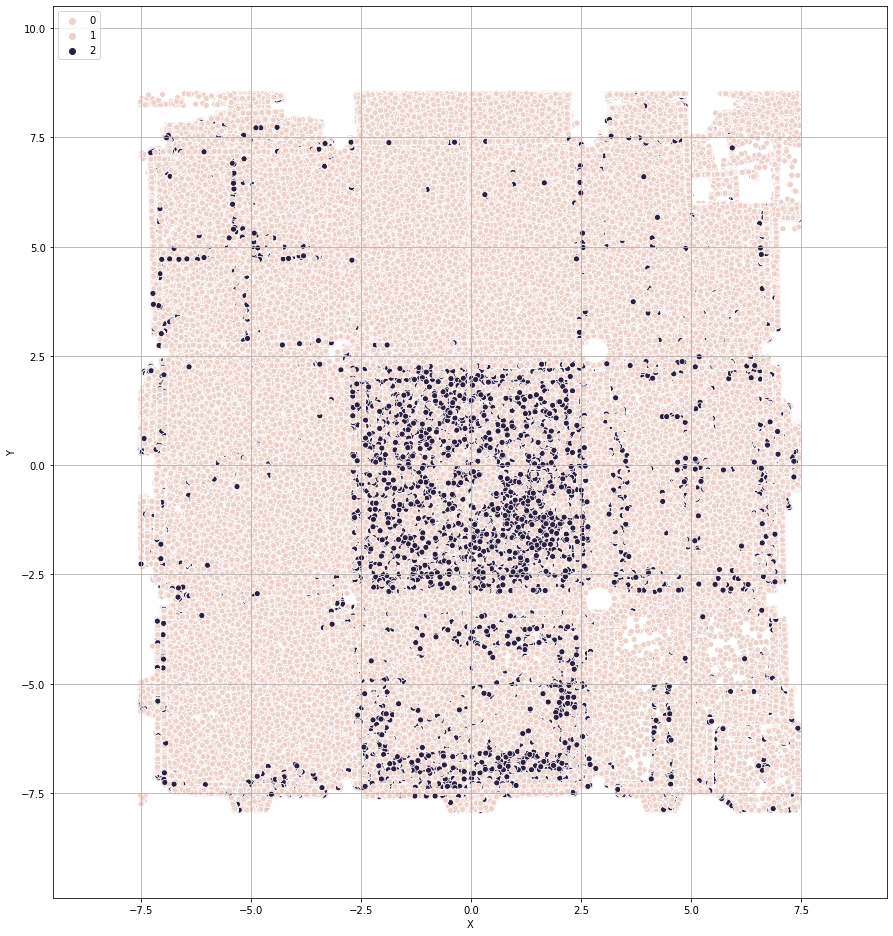

In [141]:
#PLAN (Z ELEVATION) PLOTTER
a = X.X #x axis
b = X.Y #y axis
color = y_pred.astype(int) #color class
x_neg = -7.5
x_pos = 7.45
y_neg = -7.9
y_pos = 8.5

plt.figure(figsize = ((((x_neg*-1)+x_pos)),(((y_neg*-1)+y_pos))))
plt.axis([x_neg-2, x_pos+2, y_neg-2, y_pos+2])

plan = sns.scatterplot(x = a, y = b, hue = color)
#plt.plot([0,0],[y_neg-2,y_pos+2], linewidth=4,color = 'black', linestyle = 'dashed') #Train/Test Division
plt.grid()
plt.legend(loc='upper left')



-----------
**Fit Logistic Regression Model on training data without global dimensions.**


In [181]:
logreg = LogisticRegression(solver= 'liblinear', C=1000)
logreg.fit(X_train_nodims, y_train)

LogisticRegression(C=1000, solver='liblinear')

In [182]:
y_pred = logreg.predict(X_test_nodims)

In [183]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[206814,  35505],
       [ 13737, 226937]])

In [184]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITHOUT DIMENSIONS')
print('--------------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITHOUT DIMENSIONS
--------------------------
PRECISION:  0.8647129651503951
RECALL:  0.9429227918262878
F1 SCORE:  0.9021259510729135


---------------------
**Fit Logistic Regression Model on ALL data without global dimensions.**

Primarily used to plot the data for comparison.

In [185]:
X_dims = pd.concat([X_train_dims,X_test_dims])
X = pd.concat([X_train_nodims,X_test_nodims])
y = pd.concat([y_train,y_test])
y_pred = logreg.predict(X)

X = pd.concat([X,X_dims], axis=1)

In [186]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 875357 entries, 875358 to 871914
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Eigenvalue0                875357 non-null  float64
 1   Eigenvalue1                875357 non-null  float64
 2   Eigenvalue2                875357 non-null  float64
 3   Verticality                875357 non-null  float64
 4   KDistance                  875357 non-null  float64
 5   LocalReachabilityDistance  875357 non-null  float64
 6   LocalOutlierFactor         875357 non-null  float64
 7   X                          875357 non-null  float64
 8   Y                          875357 non-null  float64
 9   Z                          875357 non-null  float64
dtypes: float64(10)
memory usage: 73.5 MB


In [187]:
cm = confusion_matrix(y, y_pred)
cm

array([[375575,  62103],
       [ 21430, 416249]])

In [188]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITHOUT DIMENSIONS ALL DATA')
print('-----------------------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITHOUT DIMENSIONS ALL DATA
-----------------------------------
PRECISION:  0.8701730106699669
RECALL:  0.9510371756469924
F1 SCORE:  0.9088098546883239


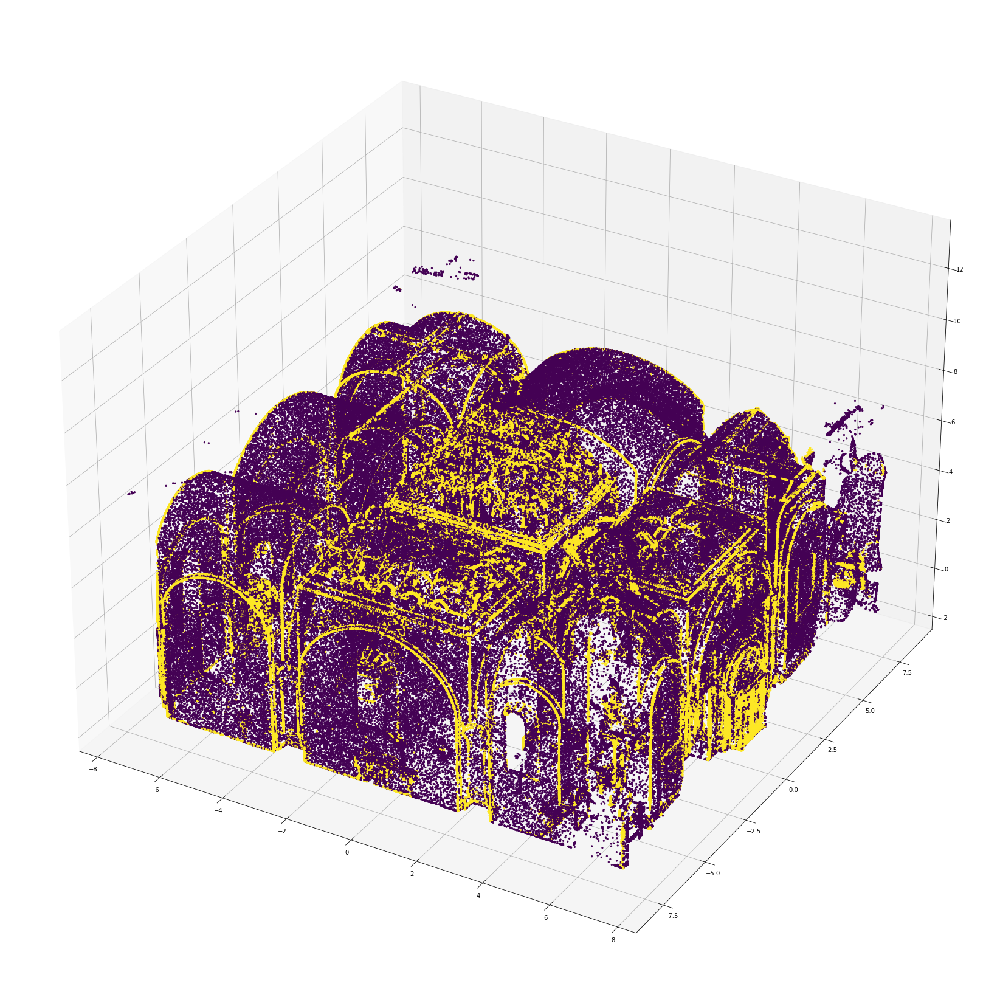

In [189]:
fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

xs = X.X
ys = X.Y
zs = X.Z
ax.scatter(xs, ys, zs, s=5, alpha = 1, c = y_pred)

plt.show()

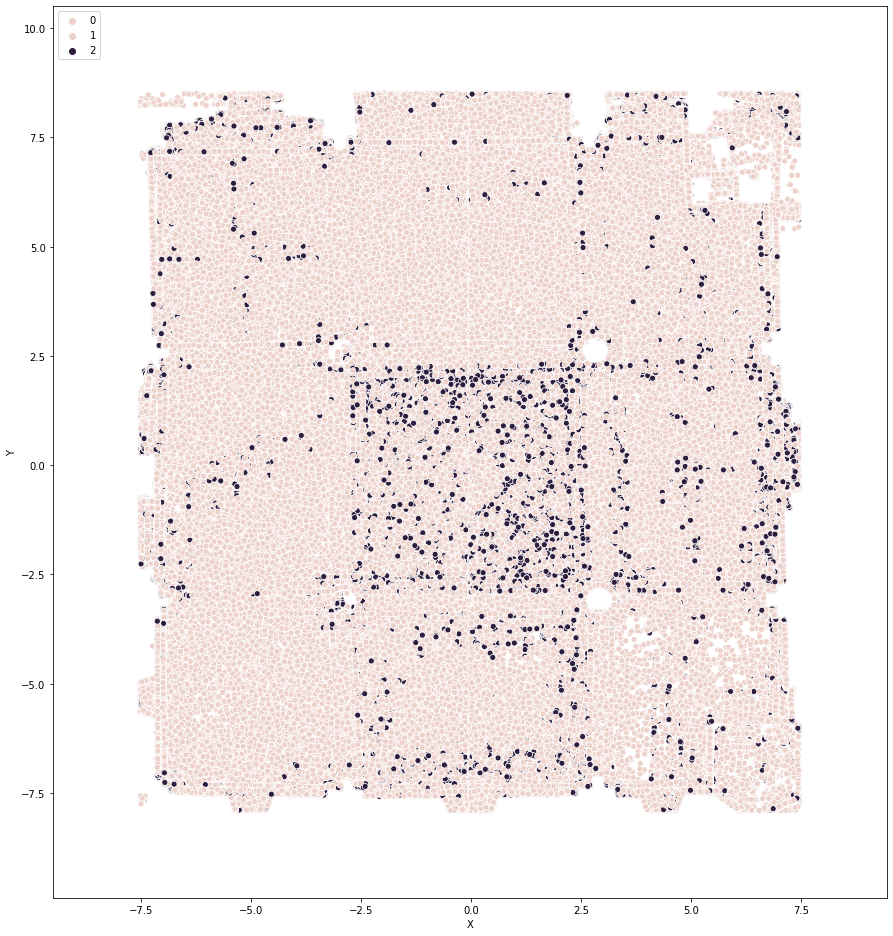

In [190]:
#PLAN (Z ELEVATION) PLOTTER
a = X.X #x axis
b = X.Y #y axis
color = y_pred.astype(int) #color class
x_neg = -7.5
x_pos = 7.45
y_neg = -7.9
y_pos = 8.5

plt.figure(figsize = ((((x_neg*-1)+x_pos)),(((y_neg*-1)+y_pos))))
plt.axis([x_neg-2, x_pos+2, y_neg-2, y_pos+2])

plan = sns.scatterplot(x = a, y = b, hue = color)
#plt.plot([0,0],[y_neg-2,y_pos+2], linewidth=4,color = 'black', linestyle = 'dashed') #Train/Test Division
#plt.grid()
plt.legend(loc='upper left')



## 3. XGBoost Model

In [162]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.metrics import accuracy_score

In [158]:
X_train_xgb, X_val, y_train_xgb, y_val = train_test_split(X_train_nodims, y_train, test_size=0.25, random_state=1337)

In [191]:
gbm = xgb.XGBClassifier( 
                        n_estimators=30000,
                        max_depth=4,
                        objective='binary:logistic', #new objective
                        learning_rate=.05, 
                        subsample=.8,
                        min_child_weight=3,
                        colsample_bytree=.8
                       )

eval_set=[(X_train_xgb,y_train_xgb),(X_val,y_val)]
fit_model = gbm.fit( 
                    X_train_xgb, y_train_xgb, 
                    eval_set=eval_set,
                    eval_metric='error', #new evaluation metric: classification error (could also use AUC, e.g.)
                    early_stopping_rounds=50,
                    verbose=False
                   )
y_pred = gbm.predict(X_test_nodims, ntree_limit=gbm.best_ntree_limit)
accuracy_score(y_test, y_pred)

0.9835194298882178

In [192]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[238093,   4226],
       [  3734, 236940]])

In [193]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITHOUT DIMENSIONS')
print('-----------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITHOUT DIMENSIONS
-----------------------
PRECISION:  0.9824768002123019
RECALL:  0.9844852372919385
F1 SCORE:  0.9834799933587913


In [194]:
X = pd.concat([X_train_nodims,X_test_nodims])
y = pd.concat([y_train,y_test])
y_pred = gbm.predict(X, ntree_limit=gbm.best_ntree_limit)

X_dims = pd.concat([X_train_dims,X_test_dims])
X = pd.concat([X,X_dims], axis=1)

In [195]:
cm = confusion_matrix(y, y_pred)
cm

array([[431481,   6197],
       [  4911, 432768]])

In [196]:
precision = cm[1][1]/(cm[1][1]+cm[0][1])
recall = cm[1][1] / (cm[1][1]+cm[1][0])
f1_score = 2*((precision * recall) / (precision + recall))

print('METRICS WITHOUT DIMENSIONS')
print('-----------------------')
print('PRECISION: ', precision)
print('RECALL: ', recall)
print('F1 SCORE: ', f1_score)

METRICS WITHOUT DIMENSIONS
-----------------------
PRECISION:  0.9858827013543221
RECALL:  0.9887794479515809
F1 SCORE:  0.9873289499500367


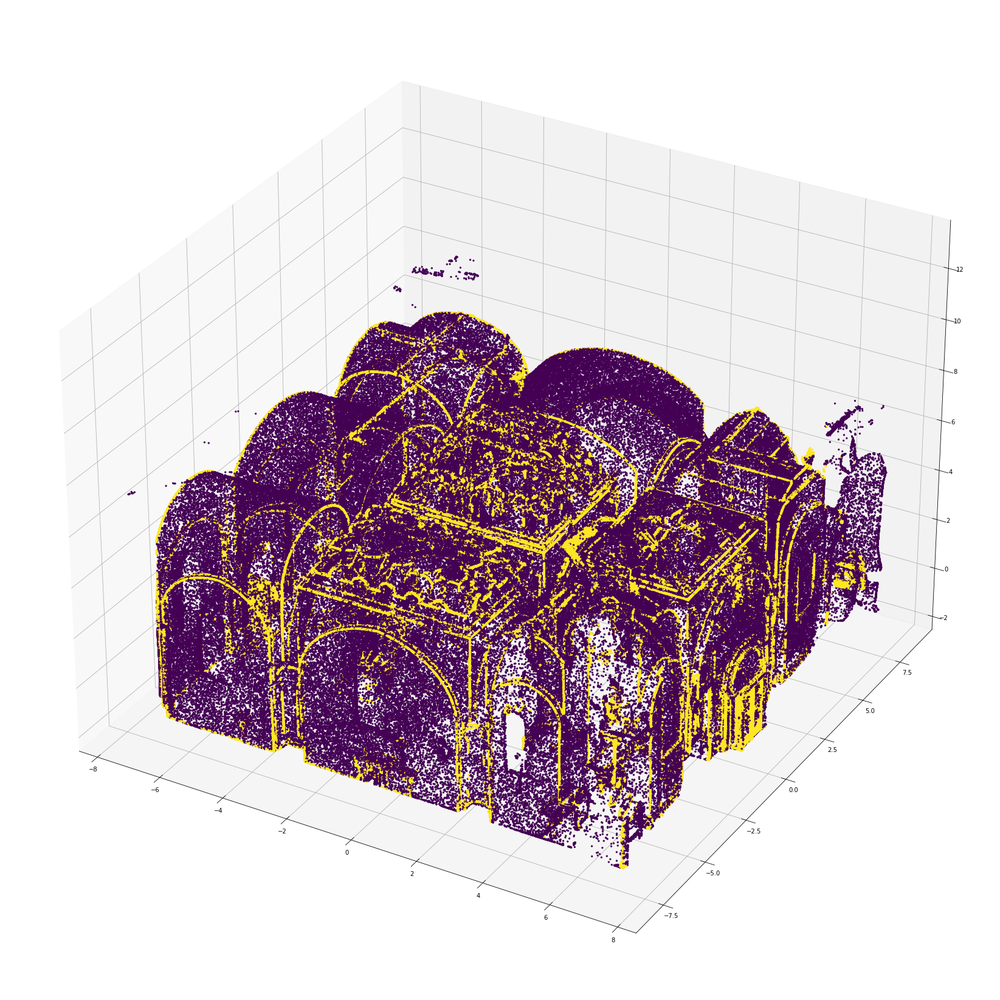

In [174]:
fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

xs = X.X
ys = X.Y
zs = X.Z
ax.scatter(xs, ys, zs, s=5, alpha = 1, c = y_pred)

plt.show()

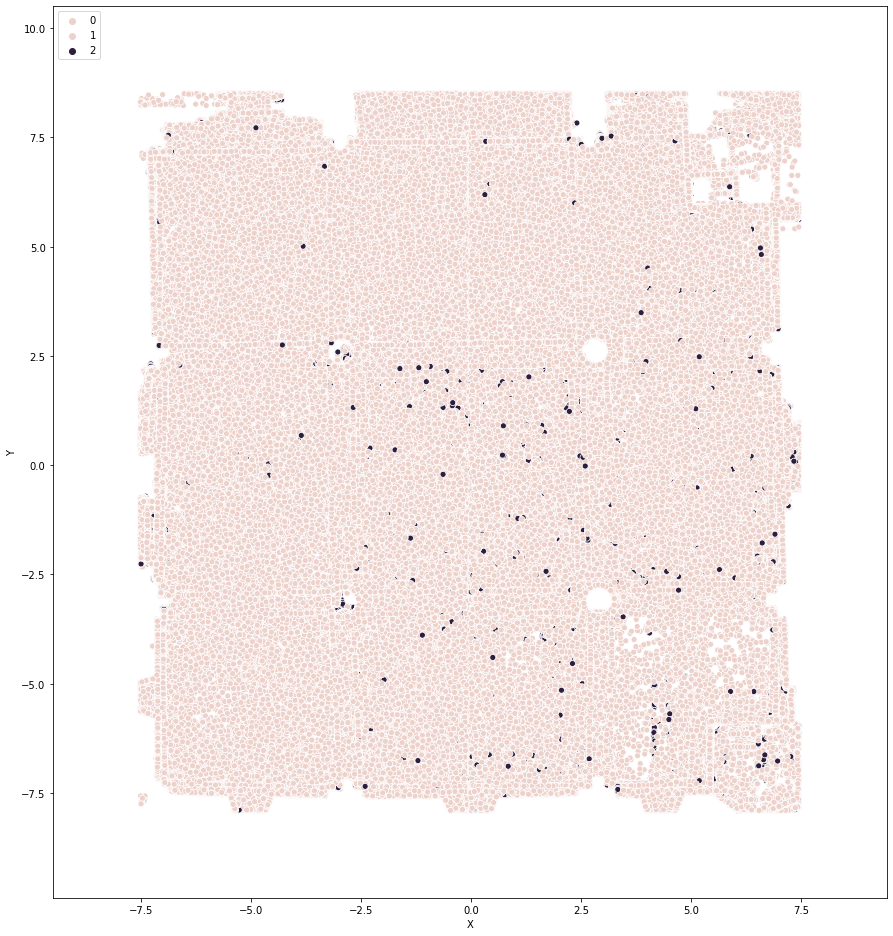

In [197]:
#PLAN (Z ELEVATION) PLOTTER
a = X.X #x axis
b = X.Y #y axis
color = y_pred.astype(int) #color class
x_neg = -7.5
x_pos = 7.45
y_neg = -7.9
y_pos = 8.5

plt.figure(figsize = ((((x_neg*-1)+x_pos)),(((y_neg*-1)+y_pos))))
plt.axis([x_neg-2, x_pos+2, y_neg-2, y_pos+2])

plan = sns.scatterplot(x = a, y = b, hue = color)
#plt.plot([0,0],[y_neg-2,y_pos+2], linewidth=4,color = 'black', linestyle = 'dashed') #Train/Test Division
#plt.grid()
plt.legend(loc='upper left')

